In [20]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import cv2
import glob
import matplotlib.pyplot as plt
import numpy as np
import os
import time
from utils import *
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.calibration import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
### DATA LOAD ###

# Load car positive images
basedir = 'data/vehicles/'
image_types = os.listdir(basedir)
cars = []
for imtype in image_types:
    cars.extend(glob.glob(basedir+imtype+'/*'))    
print('Number of Vehicle Images found:', len(cars))
with open("cars.txt", 'w') as f:
    for fn in cars:
        f.write(fn+'\n')

# Load non-vehicle negative images
basedir = 'data/non-vehicles/'
image_types = os.listdir(basedir)
notcars = []
for imtype in image_types:
    notcars.extend(glob.glob(basedir+imtype+'/*'))
print('Number of Non-Vehicle Images found:', len(notcars))
with open("notcars.txt", 'w') as f:
    for fn in notcars:
        f.write(fn+'\n')

Number of Vehicle Images found: 8792
Number of Non-Vehicle Images found: 8968


In [4]:
### GRAB RANDOM SINGLE CAR and NOT-CAR ###

# choose random car / not-car indices
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

#read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

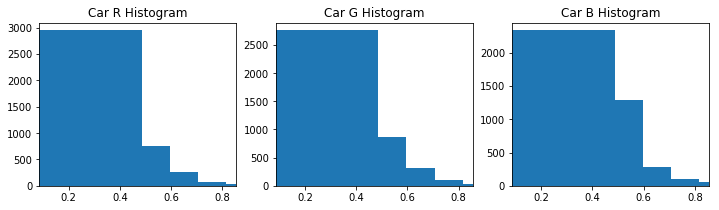

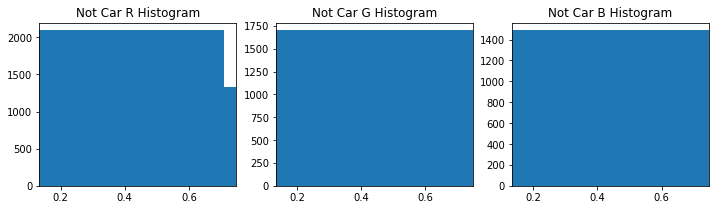

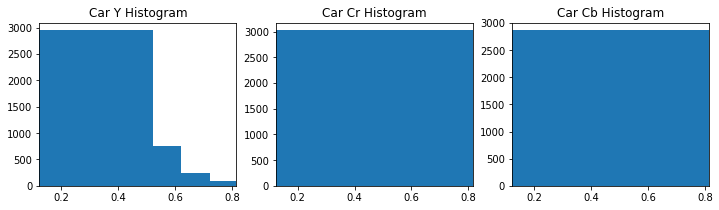

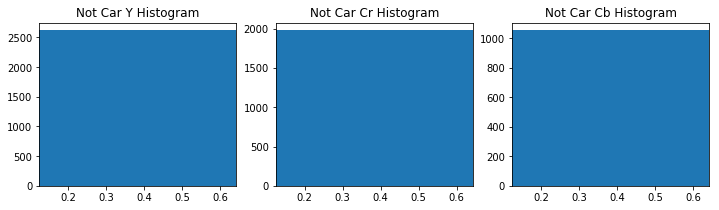

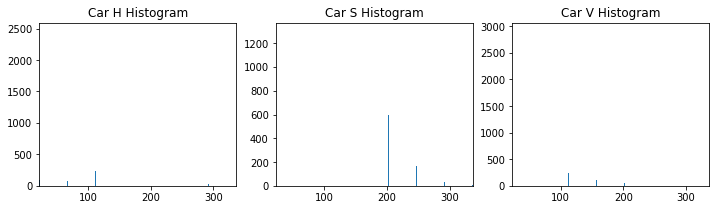

...

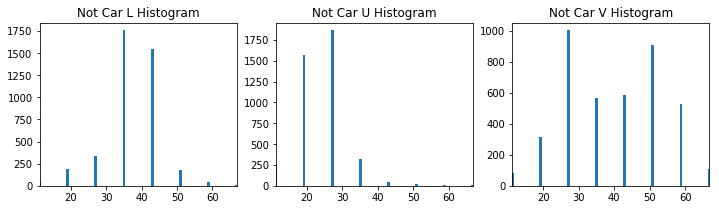

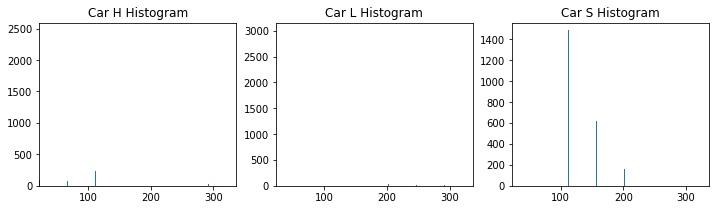

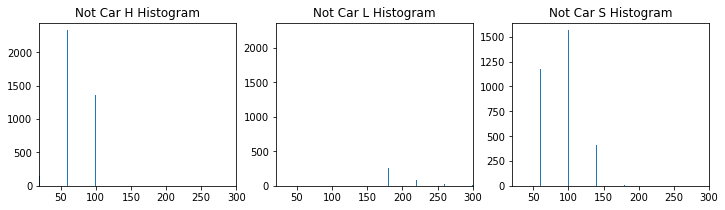

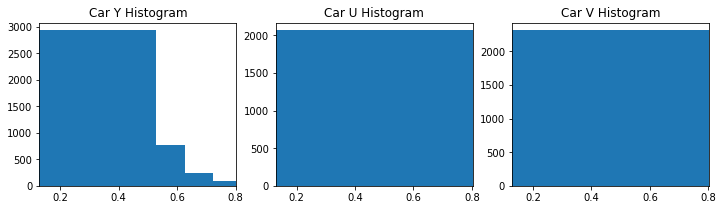

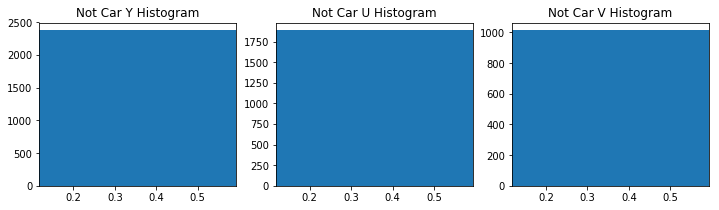

In [5]:
### VISUALIZE HISTOGRAM of COLOR CHANNELS in RGB ###

def visualHist(img, text, mode):
    modeText = {'RGB': ('R','G','B'),'HSV':('H','S','V'),
               'LUV':('L','U','V'), 'HLS':('H','L','S'),
               'YUV':('Y','U','V'),'YCrCb':('Y','Cr','Cb')}
    img = np.copy(img)
    img = color_mode(img,mode)

    # Generate histograms
    rhist = np.histogram(img[:,:,0], bins=8)
    ghist = np.histogram(img[:,:,1], bins=8)
    bhist = np.histogram(img[:,:,2], bins=8)
    
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2

    # Plot a figure with all three bar charts
    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.bar(bin_centers, rhist[0])
    plt.xlim(min(bin_centers), max(bin_centers))
    plt.title(text+' '+modeText[mode][0]+' Histogram')
    plt.subplot(132)
    plt.bar(bin_centers, ghist[0])
    plt.xlim(min(bin_centers), max(bin_centers))
    plt.title(text+' '+modeText[mode][1]+' Histogram')
    plt.subplot(133)
    plt.bar(bin_centers, bhist[0])
    plt.xlim(min(bin_centers), max(bin_centers))
    plt.title(text+' '+modeText[mode][2]+' Histogram')

visualHist(car_image,'Car','RGB')
visualHist(notcar_image,'Not Car','RGB')
visualHist(car_image,'Car','YCrCb')
visualHist(notcar_image,'Not Car','YCrCb')
visualHist(car_image,'Car','HSV')
visualHist(notcar_image,'Not Car','HSV')
visualHist(car_image,'Car','LUV')
visualHist(notcar_image,'Not Car','LUV')
visualHist(car_image,'Car','HLS')
visualHist(notcar_image,'Not Car','HLS')
visualHist(car_image,'Car','YUV')
visualHist(notcar_image,'Not Car','YUV')

In [6]:
# Experiment with Feature Parameters
color_space = 'YCrCb' # can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # can be 0, 1, 2, 'ALL'
spatial_size = (24, 24) # Spatial binning dimensions (downsizing)
hist_bins = 16 # number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

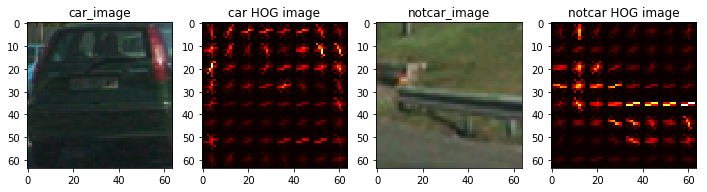

In [7]:
### Visualize effect of params on HOG for single image ###

# For visualization hog_channel will be set to 0

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=0, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=0, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat, vis=True)


images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car_image', 'car HOG image', 'notcar_image', 'notcar HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

In [8]:
### TRAIN ON CLASSIFIER and output stats ###

## block for n-sample training data set
# n_samples = 500
# random_idxs = np.random.randint(0,len(cars), n_samples)
cars = np.array(cars)[random_idxs]
notcars = np.array(notcars)[random_idxs]

t = time.time() # start timer
# Extract features from cars and notcars
car_features = extract_features(cars, color_space=color_space,
                               spatial_size=spatial_size, hist_bins=hist_bins,
                               orient=orient, pix_per_cell=pix_per_cell,
                               cell_per_block=cell_per_block, hog_channel=hog_channel,
                               spatial_feat=spatial_feat, hist_feat=hist_feat,
                               hog_feat=hog_feat)

notcar_features = extract_features(notcars, color_space=color_space,
                               spatial_size=spatial_size, hist_bins=hist_bins,
                               orient=orient, pix_per_cell=pix_per_cell,
                               cell_per_block=cell_per_block, hog_channel=hog_channel,
                               spatial_feat=spatial_feat, hist_feat=hist_feat,
                               hog_feat=hog_feat)

print(time.time()-t, 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X to Normalize the feature vectors
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split the data into randomized training and test sets
# don't need an intermediary Val set because the real end testing
# will be tracking performance on video output
rand_state = np.random.randint(0,100)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y,
                                test_size=0.1, random_state=rand_state)
# Data print out of parameters
print('Using:',orient,'orientations,',pix_per_cell,'pixels per cell',
     cell_per_block,'cells per block',hist_bins,'hostogram bins, and',
     spatial_size,'spatial sampling')
print('Feature vector length:', len(X_train[0]))

# Using a linear SVC
svc = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

94.65510129928589 Seconds to compute features...
Using: 9 orientations, 8 pixels per cell 2 cells per block 16 hostogram bins, and (24, 24) spatial sampling
Feature vector length: 7068
18.24 Seconds to train SVC...
Test Accuracy of SVC =  0.9899


0.0 1.0
0.851142168045044 seconds to process one image searching 100 windows
0.0 1.0
0.5683071613311768 seconds to process one image searching 100 windows
0.0 1.0
0.7221388816833496 seconds to process one image searching 100 windows
0.0 1.0
0.6387002468109131 seconds to process one image searching 100 windows
0.0 1.0
0.6671257019042969 seconds to process one image searching 100 windows
0.0 1.0
0.48053550720214844 seconds to process one image searching 100 windows


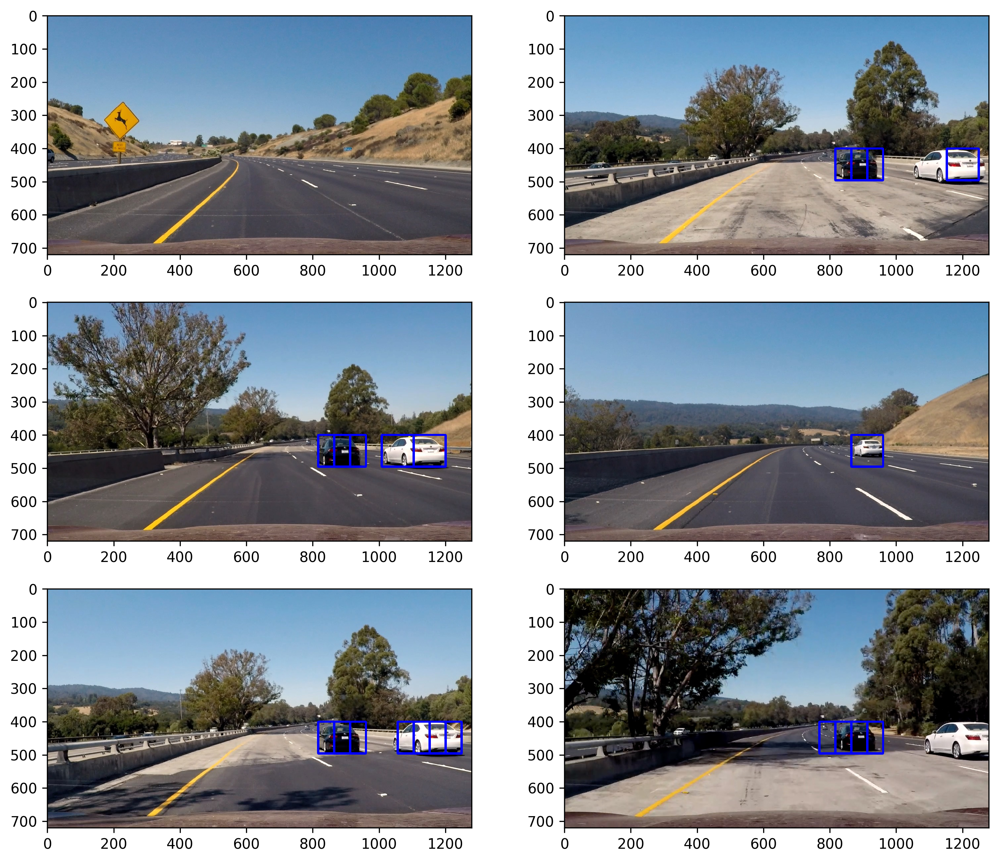

In [9]:
### TESTING CLASSIFIER PERFORMANCE AND WIN SEARCH/DRAW ON TEST IMAGES ###

searchpath = './test_images/*'
example_images = glob.glob(searchpath)
images = [] # hold images with window overlay for visualization
titles = [] # titles for visualization

y_start_stop = [400, 656] # min and max in y to search in slide_window()
overlap = 0.5
window_size = 96

for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    # scale '.jpg' to [0,1] to match PNG scale of training
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))
    
    windows = slide_window(img.shape, x_start_stop=[None, None], y_start_stop=y_start_stop,
                           xy_window=(window_size,window_size), xy_overlap=(overlap,overlap))
    
    hot_windows = search_windows(img, windows, svc, scaler=X_scaler, color_space=color_space,
                spatial_size=spatial_size, hist_bins=hist_bins, orient=orient,
                pix_per_cell=pix_per_cell,cell_per_block=cell_per_block,
                hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat,
                hog_feat=hog_feat)
    
    window_img = draw_boxes(draw_img, hot_windows, color=(0,0,255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows),
          'windows')
fit = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 5, 2, images, titles)


In [246]:
### FIND CARS USING WINDOW REGIONS FROM FULL HOG, GENERATE HEATMAP ###
def find_cars(img, windowList, drawCount=False):
    draw_img = np.copy(img)
    count = 0 # count number of windows for stats
    
    heatmap = np.zeros_like(img[:,:,0]) # Make a heatmap of zeros
    
    # convert to correct color mode for full img HOG, range to [0,1]
    im_tosearch = color_mode(img, color_space=color_space)
    im_tosearch = im_tosearch.astype(np.float32)/255
          
    # MULTIPLE WINDOW SIZES and ZONES
    # windowList[i] contains ((ystart,ystop),window_size, cells_per_step)
    # Note: cells_per_step is in lieu of overlap
    for bound, window_size, cells_per_step in windowList:
        ctrans_tosearch = np.copy(im_tosearch)
        ystart = bound[0]
        ystop = bound[1]
        scale = window_size / 64
        window = 64
        
        ctrans_tosearch = ctrans_tosearch[ystart:ystop,:,:] # image sliced to ABS window zone
        
        if scale != 1:
            imshape = ctrans_tosearch.shape
            ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
        # Manually get HOG features per channel w/o vector
        hog_featuresbyChan = []
        for channel in range(ctrans_tosearch.shape[2]):
            hog_featuresbyChan.append(get_hog_features(ctrans_tosearch[:,:,channel], orient, pix_per_cell, cell_per_block, feature_vec=False))
        
        # span is full x, and span of y bounds
        nxblocks = (ctrans_tosearch.shape[1] // pix_per_cell) - 1   
        nyblocks = (ctrans_tosearch.shape[0] // pix_per_cell) - 1

        nblocks_per_window = (window // pix_per_cell) - 1
        nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
        nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
        for xb in range(nxsteps):
            for yb in range(nysteps):
                count += 1
                ypos = yb*cells_per_step
                xpos = xb*cells_per_step

                # Extract HOG for this patch
                hog_features = grab_hog_from_patch(ypos, xpos, nblocks_per_window,
                                hog_featuresbyChan)

                # Extract the patch from img (always pass (64,64) to classfier
                xleft = xpos*pix_per_cell
                ytop = ypos*pix_per_cell
                subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window,
                        xleft:xleft+window], (64,64))

                # Get color features
                spatial_features = bin_spatial(subimg, size=spatial_size)
                hist_features = color_hist(subimg, nbins=hist_bins)

                # Scale / normalize features and make a prediction
                test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1,-1))
                test_predictions = svc.predict(test_features)
                
                #Positioned to draw ALL windows
                if drawCount == True:
                    xbox_left = np.int(xleft*scale) 
                    ytop_draw = np.int(ytop*scale)  
                    win_draw = np.int(window*scale) 
                    cv2.rectangle(draw_img, (xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255))
                  
                if test_predictions == 1:
                    xbox_left = np.int(xleft*scale) 
                    ytop_draw = np.int(ytop*scale)  
                    win_draw = np.int(window*scale) 
                    heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
    
    if drawCount == True:
        return draw_img, heatmap, count
    else:
        return heatmap


504


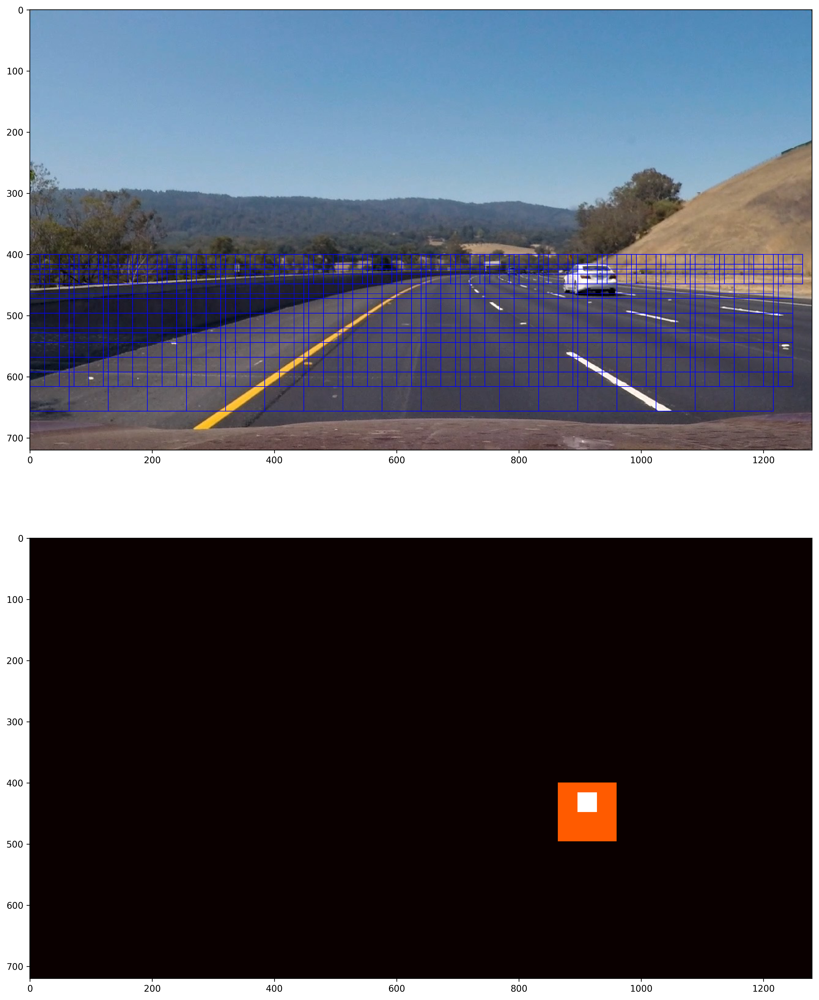

In [252]:
### VISUALIZE ALL WINDOWS ###
windowList = [[(400,464),32,4],[(400,656),96,2],[(400,720),128,4]]

img = mpimg.imread(example_images[3])
draw_images, heatmap, count = find_cars(img, windowList, drawCount=True)

imgs = []
imgs.append(draw_images)
imgs.append(heatmap)

print(count)
fig = plt.figure(figsize=(20,20), dpi=300)
visualize(fig, 2, 1, imgs,['',''])

2.091453790664673 seconds to run, total windows =  504
1.435819149017334 seconds to run, total windows =  504
0.9496243000030518 seconds to run, total windows =  504
0.9294507503509521 seconds to run, total windows =  504
1.0370473861694336 seconds to run, total windows =  504
0.9693396091461182 seconds to run, total windows =  504


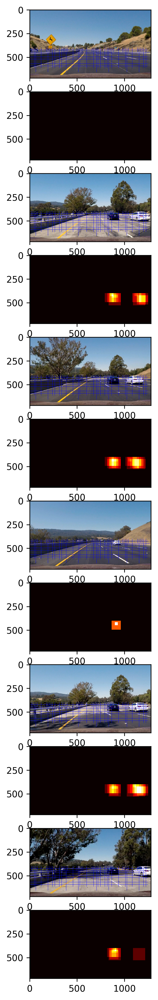

In [253]:
### TEST HOG BY WINDOW REGION FROM SINGLE FULL IMAGE HOG CALCULATION ### 
### VISUALIZE HEATMAP ### 400,656
out_images = []
out_titles = []
#windowList = [[(400,432),32,2],[(400,656),96,2],[(400,656),128,4]]
#windowList = [[(400,464),32,2],[(400,656),96,2],[(400,656),128,4]]

#for img in example_images:
for img_src in example_images:
    t = time.time()
    img = mpimg.imread(img_src)
    draw_img, heatmap, count = find_cars(img,windowList,drawCount=True)
    
    out_images.append(draw_img)
    out_titles.append('')
    out_images.append(heatmap)
    out_titles.append('')
    print(time.time()-t, 'seconds to run, total windows = ', count)
    
fig = plt.figure(figsize=(20,20), dpi=300)
visualize(fig, 12, 1, out_images, out_titles)

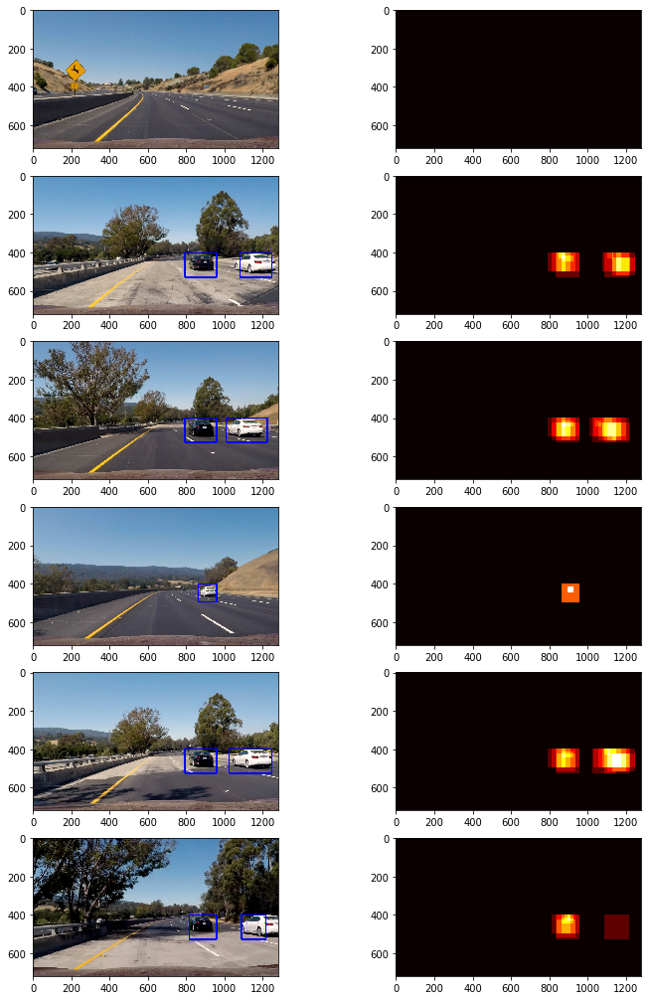

In [254]:
from scipy.ndimage.measurements import label

### DRAW BOUNDING BOXES USING HEAT MAP LABELS ###
out_images =[]
out_titles =[]
for img_src in example_images:
    img = mpimg.imread(img_src)
    heat_map = find_cars(img, windowList)
    labels = label(heat_map)
    # Draw bounding boxes on a copy of the image
    draw_image = draw_labeled_bboxes(np.copy(img), labels)
    out_images.append(draw_image)
    out_images.append(heat_map)
    out_titles.append('')
    out_titles.append('')
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

In [230]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip, ImageSequenceClip
from IPython.display import HTML

class Buffer():
    def __init__(self, max_buffer, threshold):
        self.buffer = []
        self.MAX_BUFFER = max_buffer
        self.threshold = threshold
    
    def process_image(self, img):
        heat_map = find_cars(img, windowList)
        thresh_map = None
        
        self.buffer.append(heat_map)
        
        if len(self.buffer) == self.MAX_BUFFER:
            # Create thresholded map over the buffer frames
            thresh_map = np.sum(self.buffer, axis=0)
            thresh_map = apply_threshold(thresh_map, threshold=self.threshold)
            # Drop the oldest map
            self.buffer = self.buffer[1:] # drop oldest heat_map
        else:
            thresh_map = heat_map
        
        labels = label(thresh_map)
        draw_img = draw_labeled_bboxes(np.copy(img), labels)
        return draw_img
    
# Create Buffered Processing Object
buffProcess = Buffer(max_buffer = 4, threshold = 8)

#test_output = 'testProcessed.mp4'
#clip = VideoFileClip('test_video.mp4')
test_output = 'projProcessed.mp4'
clip = VideoFileClip('project_video.mp4')
test_clip = clip.fl_image(buffProcess.process_image)
test_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video projProcessed.mp4
[MoviePy] Writing video projProcessed.mp4






  0%|          | 0/1261 [00:00<?, ?it/s]



  0%|          | 1/1261 [00:00<14:15,  1.47it/s]



  0%|          | 2/1261 [00:01<14:19,  1.47it/s]



  0%|          | 3/1261 [00:02<15:18,  1.37it/s]



  0%|          | 4/1261 [00:02<14:47,  1.42it/s]



  0%|          | 5/1261 [00:03<14:25,  1.45it/s]



  0%|          | 6/1261 [00:04<14:06,  1.48it/s]



  1%|          | 7/1261 [00:04<14:57,  1.40it/s]



  1%|          | 8/1261 [00:05<14:45,  1.41it/s]



  1%|          | 9/1261 [00:06<14:30,  1.44it/s]



  1%|          | 10/1261 [00:07<14:29,  1.44it/s]



  1%|          | 11/1261 [00:07<14:07,  1.47it/s]



  1%|          | 12/1261 [00:08<14:33,  1.43it/s]



  1%|          | 13/1261 [00:09<14:14,  1.46it/s]



  1%|          | 14/1261 [00:09<14:12,  1.46it/s]



  1%|          | 15/1261 [00:10<15:01,  1.38it/s]



  1%|▏         | 16/1261 [00:11<16:54,  1.23it/s]



  1%|▏         | 17/1261 [00:12<16:29,  1.26it/s]



  1%|▏         | 18/1261 [00:12<15:41,  1.32it/s]



  2%|▏ 

[MoviePy] Done.
[MoviePy] >>>> Video ready: projProcessed.mp4 

